# Noisy and Repellant

Your task with this assignment is to parallelize a serial application using OpenMP, and to use profiling tools to assess different approaches to that parallelization.

**Due Thursday, September 19, before class**

This assignment is intended for the CPU-only nodes, where we can get a lot of CPU thread concurrency.  However, once you have completed the main part of the assignment, if you intend to do the bonus work using the GPUs, complete that portion on a node with a P100 GPU.

In [18]:
module use $CSE6230_DIR/modulefiles
module load cse6230/core

|                                                                         |
|       A note about python/3.6:                                          |
|       PACE is lacking the staff to install all of the python 3          |
|       modules, but we do maintain an anaconda distribution for          |
|       both python 2 and python 3. As conda significantly reduces        |
|       the overhead with package management, we would much prefer        |
|       to maintain python 3 through anaconda.                            |
|                                                                         |
|       All pace installed modules are visible via the module avail       |
|       command.                                                          |
|                                                                         |


Last time, we modelled non-interacting particles as an example of a streaming kernel.  This time, we are going to advance things a bit and have particles that interact with each other and with the "media" in which they move.

Both gravitational and electrical forces are often modeled as deriving from a simple *potential*: the potential between two particles $p_1$ and $p_2$ is a function of their distance:

$$ \varphi(p_1, p_2) = k \frac{e_1 e_2}{\|r_1 - r_2\|}, $$

Where $r_1$ and $r_2$ are their positions, $e_1$ and $e_2$ are their charges, and $k$ is a scaling factor.  In this assignment we will assume $e_i = 1$ for all particles.  The force acting on $p_1$ due to the potential is the negative of its gradient with respect to $r_2$,

$$ F(p_1, p_2) = -\nabla_{r_1} \varphi(p_1, p_2). $$

The whole equal-and-opposite thing in physics implies that a force with the same magnitude and opposite direction acts on $p_2$: $F(p_2, p_1) = - F(p_1, p_2)$.  In this toy problem, all particle masses are equal to 1, so the acceleration due to a force is equivalent to the force.  The *total acceleration* experienced by a particle is the sum of the forces from all other particles:

$$ \partial v_i / \partial t = \sum_{j \neq i} F(p_i, p_j).$$

Now we see what makes this different from the streaming kernel we studied last week: to update one particle involves contributions from all other particles, $O(N_p^2)$ interactions!

Particles that are affected only by potentials is a good model for particles moving in a vaccuum, but sometimes we want to model particles moving in a medium, where the collide frequently and randomly with other particles.  This type of motion is called [Brownian motion](https://en.wikipedia.org/wiki/Brownian_motion). We'll skip a bunch of statistical physics and jump to the conclusion: whereas numerical time-stepping of a classical force
often takes the form of an update like

$$ x_{i,t+1} = x_{i,t} + f \Delta{t}, $$

Brownian motion looks like,

$$ x_{i,t+1} = x_{i,t} + \sqrt{2 d \Delta{t}}z, $$

where $z$ is a realization of a random variable.

If we have charged particles moving in a medium, then both potential and noisy contributions affect the motion of the particle.  Our program for this assignment includes both!  That makes this program more complicated to model and to optimize: we cannot reduce the performance down to the behavior of one kernel, but must try to evaluate when each kernel is the bottleneck.

Before you start with the actual assignment, let me show you what all of this looks like.
We run the program with `make runcloud`, like last time, and many of the variables that define the behavior of the target are the same: `NP` is the number of particles, `DT` is the step size, and `NT` is the number of steps. `K` is the potential coefficient $k$: negative values cause particles to attract and positive values cause particles to repel.  `D` is the diffusion coefficient of Brownian motion.

We can make this example look most like the last assignment by turning off Brownian motion and choosing negative $k$:

In [2]:
make runcloud NP=32 DT=1.e-5 NT=400 D=0. K=-1.

make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 32 400 1.e-5 -1. 0.
[./cloud] NUM_POINTS=32, NUM_STEPS=400, CHUNK_SIZE=400, DT=1e-05, K=-1, D=0
[./cloud] Hamiltonian, T = 0: -1772.57
[./cloud] Simulation walltime: 0.0213363
[./cloud] Hamiltonian, T = 0.004: -1772.57, Relative Error: -6.6997e-09
[./cloud] Average Distance Traveled: 0.00406223


You'll notice the output describes the "Hamiltonian" of the system.  This is like the total energy, and is theoretically conserved.  When I ran the above, it was conserved to 5 decimal places.  But these $n$-body systems are chaotic, and in particular they are unstable with particles that attract each other.  If we run the same program for just twice as long:

In [4]:
make runcloud NP=32 DT=1.e-5 NT=800 D=0. K=-1.

make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 32 800 1.e-5 -1. 0.
[./cloud] NUM_POINTS=32, NUM_STEPS=800, CHUNK_SIZE=800, DT=1e-05, K=-1, D=0
[./cloud] Hamiltonian, T = 0: -1772.57
[./cloud] Simulation walltime: 0.0390267
[./cloud] Hamiltonian, T = 0.008: 3534.09, Relative Error: -2.99377
[./cloud] Average Distance Traveled: 0.00993427


For this assignment, I made a tool for us to visualize our simulations.  We can generate videos of our simulations, and we can embed them in this notebook.  We do this with the
`make vizcloud` target, which takes the same arguments as `make runcloud`, but also `CHUNK` (the number of time steps between frames of the video) and `VIZNAME`, the basename of the output video.  Like so:

make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 8 800 1.e-3 -1. 0.0 10 attract | xvfb-run python3 cloud.py


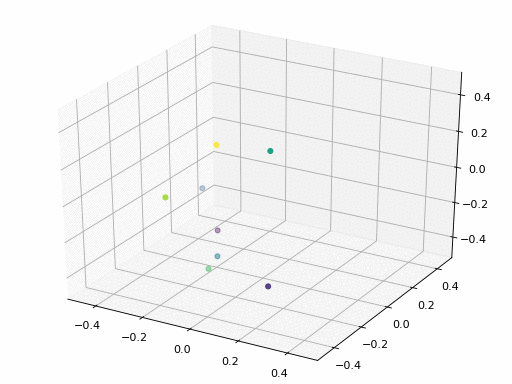

In [18]:
make vizcloud NP=8 DT=1.e-3 NT=800 D=0.0 K=-1. CHUNK=10 VIZNAME="attract"
display < attract.gif

You can see that the particles fling each other around, and with our fixed time step big errors occur when particles get close to each other.

You'll also notice that this problem occurs in a periodic domain, so particles can't get away from each other.  This ensures that they keep interacting, and is a common strategy to simulate an infinite, uniform distribution of particles.

If we instead model particles that repel each other, this behavior is a bit more stable:

make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 8 800 1.e-3 1. 0.0 10 repel | xvfb-run python3 cloud.py


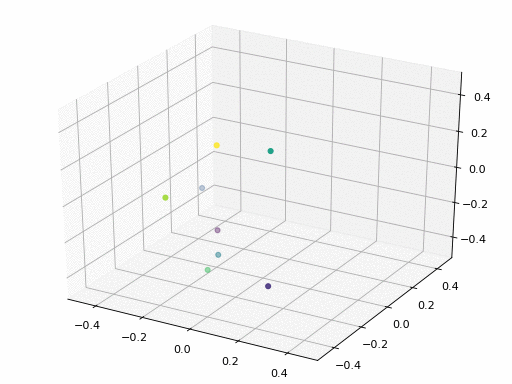

In [20]:
make vizcloud NP=8 DT=1.e-3 NT=800 D=0.0 K=1. CHUNK=10 VIZNAME="repel"
display < repel.gif

Finally, if we turn the potential interactions off, and turn the noisy interactions back on, we see browning motion:

make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 8 800 1.e-3 0. 0.1 10 noisy | xvfb-run python3 cloud.py


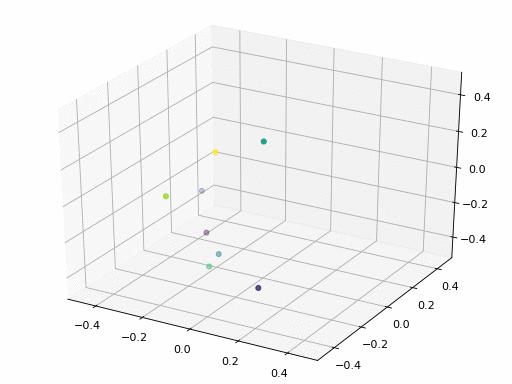

In [22]:
make vizcloud NP=8 DT=1.e-3 NT=800 D=0.1 K=0. CHUNK=10 VIZNAME="noisy"
display < noisy.gif

With Brownian motion, there is no "right" path for a particle to take, so any verification of the behavior has to be *statistical.*  In particular, one behavior of Brownian motion is that the distance a particle travels over time $\Delta{T}$ is on average $\sqrt{\Delta{T}}$.  We should be able to verify this: if we increase `NT` by a factor of 4, the average distance travelled should double.

In [52]:
make runcloud NP=64 DT=1.e-3 NT=800 D=0.1 K=0.

make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 64 800 1.e-3 0. 0.1
[./cloud] NUM_POINTS=64, NUM_STEPS=800, CHUNK_SIZE=800, DT=0.001, K=0, D=0.1
[./cloud] Hamiltonian, T = 0: 0
[./cloud] Simulation walltime: 0.00429289
[./cloud] Hamiltonian, T = 0.8: 0, Relative Error: 0
[./cloud] Average Distance Traveled: 0.370261


In [26]:
make runcloud NP=64 DT=1.e-3 NT=3200 D=0.1 K=0.

make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 64 3200 1.e-3 0. 0.1
[./cloud] NUM_POINTS=64, NUM_STEPS=3200, CHUNK_SIZE=3200, DT=0.001, K=0, D=0.1
[./cloud] Hamiltonian, T = 0: 0
[./cloud] Simulation walltime: 0.0170962
[./cloud] Hamiltonian, T = 3.2: 0, Relative Error: 0
[./cloud] Average Distance Traveled: 0.74266


I know this is a long set up to the assignment, but our first project is going to keep building on this particle simulation, so I would like you to have a little understanding of what the parameters to the program mean.

For the remainder of this assignment, we'll keep the parameters `K=-1.`, `D=0.1`, and `DT=1.e-3` (which are the defaults in `Makefile`)

**Question 1 (5 pts)**: This program is currently a valid serial program.  Your first task is to convert it to a high-performing OpenMP program.  You will have to change

- The compiler flags (see the `OMPFLAGS` variable in `Makefile`)
- The runtime environment (You may either add new cells in this notebook that specify environment variables like `OMP_NUM_THREADS`, or you can add those in front of the targets, like `OMP_NUM_THREADS=5 make runcloud ...`)
- The code itself.  When modifying the code, you should show awareness of the issues that we discussed in class:
  - Scheduling: have you chosen a loop schedule that is balanced?  If your schedule is dynamic, is the additional overhead worth it?
  - Race conditions: how will you handle them?
  - Scoping: are you using the variables properly?

To modify the code, there are four operations that you will need to address.

- Initializing the variables, in `initialize.c`

In [5]:
pygmentize initialize.c

#include "cloud.h"

void
initialize_variables (int Np, double k, cse6230rand_t *rand, double *X0[3], double *X[3], double *U[3])
{
  size_t init_tag;

  init_tag = cse6230rand_get_tag (rand);
  
#pragma omp parallel for
  for (int i = 0; i < Np; i+=4) { /* for every particle */
    double xval[3][4];
    double uval[3][4];

    for (int d = 0; d < 3; d++) { /* get four random doubles for each variable */
      cse6230rand_hash (rand, init_tag, i,     d, 0, &xval[d][0]);
      if (k) {
        cse6230rand_hash (rand, init_tag, i, 3 + d, 0, &uval[d][0]);
      }
      else {
        for (int j = 0; j < 4; j++) {
          uval[d][j] = 0.5;
        }
      }
    }

    if (i + 4 <= Np) {
      for (int j = 0; j < 4; j++) {
        for (int d = 0; d < 3; d++) { /* scale uniform [0,1) variables to [-1, 1) */
          X0[d][i + j] = X[d][i + j] = 2. * xval[d][j] - 1.;
          U[d][i + j] = 2. * uval[d][j] - 1.;
        }
      }
    }
    else {
      for (int j = 0; j < Np - i; j++) {
  

- Compute the Hamiltonian, in `hamiltonian.c`

In [77]:
pygmentize hamiltonian.c

#include "cloud.h"

double
compute_hamiltonian (int Np, double k, const double *X[3], const double *U[3])
{
  double h = 0.;
    

  for (int i = 0; i < Np; i++) { /* for every particle */
    h += 0.5 * (U[0][i]*U[0][i] + U[1][i]*U[1][i] + U[2][i]*U[2][i]); /* kinetic energy */
    if (k) {
#pragma omp parallel for
      for (int j = i + 1; j < Np; j++) { /* for every other particle */
        double hj = potential (k, X[0][i], X[1][i], X[2][i], X[0][j], X[1][j], X[2][j]);
        
        h += hj;
      }
    }
  }
  return h;
}


- Updating the positions due to the velocities and the noise, in `verlet_stream_and_noise.c`

In [31]:
pygmentize verlet_stream_and_noise.c

#include "cloud.h"
#include "verlet.h"

void
verlet_step_stream_and_noise (int Np, double dt_stream, double dt_noise,
                              cse6230rand_t *rand,
                              double *restrict X[3], const double *restrict U[3])
{
  if (dt_noise) {
    size_t tag;

    tag = cse6230rand_get_tag (rand);
      
#pragma omp parallel for
    for (int i = 0; i < Np; i++) {
      double rval[4];

      cse6230rand_hash (rand, tag, i, 0, 0, rval);
      
//       int my_thread = omp_get_thread_num();
//       printf("iteration %d, thread %d\n", i, my_thread);
        
      for (int d = 0; d < 3; d++) {
        X[d][i] += dt_stream * U[d][i] + dt_noise * (2. * rval[d] - 1.);
      }
    }
  }
  else {
#pragma omp parallel for      
    for (int i = 0; i < Np; i++) {
      for (int d = 0; d < 3; d++) {
        X[d][i] += dt_stream * U[d][i];
      }
    }
  }
}


- Finally, we must compute the force due to potential interactions.  There are two different approaches to how we could go about doing this:
  1. Compute each interaction $F(p_i,p_j)$ twice: once for $p_i$, and once for $p_j$, then update them separately.
  2. Compute each interaction $F(p_i,p_j)$ once, and update both particles using the equal-and-opposite rule.
  
In this assignment, we are going to do our best to optimize both approaches.

One is in `verlet_accelerate.c`, the other is in `verlet_accelerate2.c`

In [43]:
pygmentize verlet_accelerate.c

#include "verlet.h"
#include "cloud.h"

void
verlet_step_accelerate (int Np, double dt, const double *restrict X[3], double *restrict U[3])
{
    

  for (int i = 0; i < Np; i++) {
    double u[3] = {0.};
      
#pragma omp parallel for
    for (int j = 0; j < Np; j++) {
      if (j != i) {
        double du[3];

        force (dt, X[0][i], X[1][i], X[2][i], X[0][j], X[1][j], X[2][j], du);
          

        for (int d = 0; d < 3; d++) {
          u[d] += du[d];
        }
      }
    }
    for (int d = 0; d < 3; d++) {
      U[d][i] += u[d];
    }
  }
}


In [44]:
pygmentize verlet_accelerate2.c # This gets used in runcloud2

#include "verlet.h"
#include "cloud.h"

void
verlet_step_accelerate (int Np, double dt, const double *restrict X[3], double *restrict U[3])
{
    

  for (int i = 0; i < Np; i++) {
#pragma omp parallel for
    for (int j = i + 1; j < Np; j++) {
      double du[3];

      force (dt, X[0][i], X[1][i], X[2][i], X[0][j], X[1][j], X[2][j], du);

      for (int d = 0; d < 3; d++) {
        U[d][i] += du[d];
        U[d][j] -= du[d];
      }
    }
  }
}


Right now, there is a simple timer for the whole simulation.  Because this is a multikernel program, that may be insufficient to understand its behavior. 

We could modify the program to have timers for the individual kernels, or we could use profiling tools that lets us disentangle their contributions.

For this assignment, we will begin to use the tool [HPCToolkit](hpctoolkit.org) to profile our (parallel) applications.

The default class module should now load the various HPCToolkit commands.

In [1]:
which hpcrun

/nv/coc-ice/tisaac3/opt/pace-ice/hpctoolkit/bin/hpcrun


Take a look at the [overview](http://hpctoolkit.org/man/hpctoolkit.html) for how we profile an application.  There are a few distinct steps.

First, we run the code with `hpcrun` to gather statistics.  Depending on how we call it, `hpcrun` can simply keep track of the walltime of different rountines, can generate traces for all threads (`hpcrun -t`), and can also do hardware event counters (including ones we've already seen with `perf`.

In [2]:
#hpcrun -L # Call this to get a great big list of hardware counters that are available.

When you call the program with `hpcrun`, a measurements directory should be created.

In [116]:
OMP_NUM_THREADS=28 OMP_PROC_BIND=True make runcloud2 NP=512 DT=1.e-3 NT=50000 D=0.1 K=0. PERF="hpcrun"

make --silent clean
make --silent cloud2
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
hpcrun ./cloud2 512 50000 1.e-3 0. 0.1
[./cloud2] NUM_POINTS=512, NUM_STEPS=50000, CHUNK_SIZE=50000, DT=0.001, K=0, D=0.1
[./cloud2] Hamiltonian, T = 0: 0
[./cloud2] Simulation walltime: 0.547968
[./cloud2] Hamiltonian, T = 50: 0, Relative Error: 0
[./cloud2] Average Distance Traveled: 2.91431


In [89]:
# resubmission test1
make clean
OMP_NUM_THREADS=14 OMP_PROC_BIND=spread make runcloud NP=64 DT=1.e-3 NT=8000 D=0.1 K=-1. 

rm -f *.o cloud cloud2 cloudgpu
make --silent clean
make --silent cloud
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud 64 8000 1.e-3 -1. 0.1
[./cloud] NUM_POINTS=64, NUM_STEPS=8000, CHUNK_SIZE=8000, DT=0.001, K=-1, D=0.1
[./cloud] Hamiltonian, T = 0: -7094.6
[./cloud] Simulation walltime: 0.876776
[./cloud] Hamiltonian, T = 8: 304227, Relative Error: -43.8815
[./cloud] Average Distance Traveled: 355.834


In [87]:
# resubmission test2 
make clean
OMP_NUM_THREADS=14 OMP_PROC_BIND=spread make runcloud2 NP=64 DT=1.e-3 NT=8000 D=0.1 K=-1. 

rm -f *.o cloud cloud2 cloudgpu
make --silent clean
make --silent cloud2
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
icc: remark #10397: optimization reports are generated in *.optrpt files in the output location
./cloud2 64 8000 1.e-3 -1. 0.1
[./cloud2] NUM_POINTS=64, NUM_STEPS=8000, CHUNK_SIZE=8000, DT=0.001, K=-1, D=0.1
[./cloud2] Hamiltonian, T = 0: -7094.6
[./cloud2] Simulation walltime: 2.12296
[./cloud2] Hamiltonian, T = 8: 155502, Relative Error: -22.9184
[./cloud2] Average Distance Traveled: 286.404


In [117]:
!ls -d hpctoolkit-*

hpctoolkit-cloud2-measurements-107685.ice-sched.pace.gatech.edu
hpctoolkit-cloud-database-107685.ice-sched.pace.gatech.edu
hpctoolkit-cloud-database-107685.ice-sched.pace.gatech.edu-107685.ice-sched.pace.gatech.edu
hpctoolkit-cloud-database-107685.ice-sched.pace.gatech.edu-29551
hpctoolkit-cloud-database-107685.ice-sched.pace.gatech.edu-30590
hpctoolkit-cloud-database-107685.ice-sched.pace.gatech.edu-31401
hpctoolkit-cloud-measurements-107685.ice-sched.pace.gatech.edu


Next, we have to help HPCToolkit know which measurements go with which part of the source code: we do this with `hpcstruct`:

In [122]:
!hpcstruct ./cloud2

In [123]:
ll cloud2.hpcstruct

-rw-r--r-- 1 zjiang333 73825 Sep 19 02:29 cloud2.hpcstruct


Finally we generate a profiling database with `hpcprof` by combining the `hpcstruct` file with the measurements:

In [124]:
!hpcprof -S cloud2.hpcstruct hpctoolkit-cloud2-measurements-*.ice-sched.pace.gatech.edu

msg: STRUCTURE: /nv/coc-ice/zjiang333/cse6230-hw/4-interacting-particles/cloud2
msg: Line map : /nv/coc-ice/tisaac3/opt/pace-ice/hpctoolkit/lib/hpctoolkit/ext-libs/libmonitor.so.0.0.0
msg: Line map : /nv/usr-local-rhel6.7/pacerepov1/intel/compiler/16.0/compilers_and_libraries_2016.0.109/linux/compiler/lib/intel64_lin/libiomp5.so
msg: Line map : /lib64/libpthread-2.12.so
msg: Line map : /lib64/libc-2.12.so
msg: Populating Experiment database: /nv/coc-ice/zjiang333/cse6230-hw/4-interacting-particles/hpctoolkit-cloud2-database-107685.ice-sched.pace.gatech.edu


In [130]:
!./cloud2 4 5000000 1.e-3 0. 0.1

[./cloud2] NUM_POINTS=4, NUM_STEPS=5000000, CHUNK_SIZE=5000000, DT=0.001, K=0, D=0.1
[./cloud2] Hamiltonian, T = 0: 0
[./cloud2] Simulation walltime: 2.36804
[./cloud2] Hamiltonian, T = 5000: 0, Relative Error: 0
[./cloud2] Average Distance Traveled: 28.7005


Once you have the `hpctoolkit-database` directory, you can use the GUI tools `hpcviewer` and `hpctraceviewer` (if you used `hpcrun -t`), which will help you see walltime and/or hardware event counters for the routines in your program.

**Question 2 (5 pts)**: Call `make runcloud` and `make runcloud2` for different numbers of particles `NP`.  Try to scale `NT` so that each simulation runs for about a second.  Use HPCToolkit, get the data to generate a plot with three lines:

- $x$ axis: number of particles.
- $y$ axis: walltime per particle time step (so take walltime and divide by `NP * NT`
- Line 1: the time taken by `verlet_step_stream_and_noise` in either version of the simulation
- Line 2: the time taken by `verlet_accelerate` in `runcloud`
- Line 3: the time taken by `verlet_accelerate2` in `runcloud2`

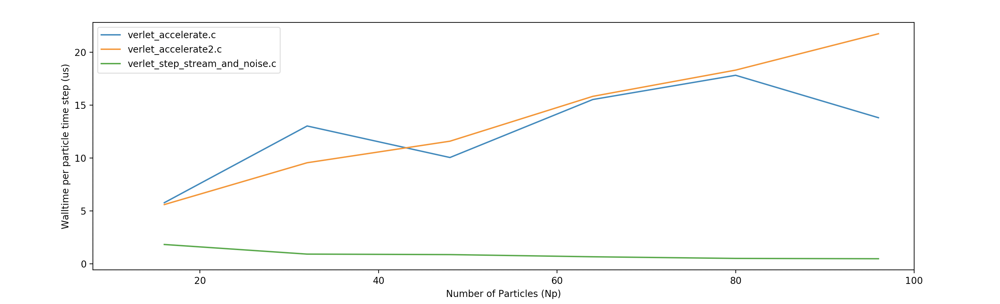

In [1]:
display < plot.jpg

**Bonus (3 pts)**: Instead of parallelizing using OpenMP just for the CPUs, we could also use OpenMP parallelization for the GPUs.  To do this, you will need to use the gcc + OpenMP version of the course modules:

In [17]:
module unload cse6230/core
module load cse6230/gcc-omp-gpu

|                                                                         |
|       A note about python/3.6:                                          |
|       PACE is lacking the staff to install all of the python 3          |
|       modules, but we do maintain an anaconda distribution for          |
|       both python 2 and python 3. As conda significantly reduces        |
|       the overhead with package management, we would much prefer        |
|       to maintain python 3 through anaconda.                            |
|                                                                         |
|       All pace installed modules are visible via the module avail       |
|       command.                                                          |
|                                                                         |


In [13]:
make clean
OMP_NUM_THREADS=8 OMP_PROC_BIND=true make runcloudgpu NP=64 DT=1.e-3 NT=8000 D=0.1 K=-1. 

rm -f *.o cloud cloud2 cloudgpu
make --silent clean
make --silent cloudgpu
verlet_stream_and_noise.c: In function ‘verlet_step_stream_and_noise’:
verlet_stream_and_noise.c:15: warning: ignoring #pragma omp parallel
verlet_stream_and_noise.c:30: warning: ignoring #pragma omp parallel
verlet_accelerate_gpu.c: In function ‘verlet_step_accelerate’:
verlet_accelerate_gpu.c:13: warning: ignoring #pragma omp target
verlet_accelerate_gpu.c:16: warning: ignoring #pragma omp parallel
initialize.c: In function ‘initialize_variables’:
initialize.c:11: warning: ignoring #pragma omp parallel
hamiltonian.c: In function ‘compute_hamiltonian’:
hamiltonian.c:13: warning: ignoring #pragma omp parallel
./cloudgpu 64 8000 1.e-3 -1. 0.1
[./cloudgpu] NUM_POINTS=64, NUM_STEPS=8000, CHUNK_SIZE=8000, DT=0.001, K=-1, D=0.1
[./cloudgpu] Hamiltonian, T = 0: -7094.6
[./cloudgpu] Simulation walltime: 2.06831
[./cloudgpu] Hamiltonian, T = 8: 123296, Relative Error: -18.3789
[./cloudgpu] Average Distance Traveled: 263

Create a new file `verlet_accelerate_gpu.c` by copying either `verlet_accelerate.c` or `verlet_accelerate2.c` and a new makefile target `runcloudgpu` which demonstrates using the `omp target` directive to run the force calculations on the GPU.  Insert a cell below this one that calls `runcloudgpu` and verifies that it ran on the GPUs with `nvprof`.